In [1]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, SpatialDropout1D
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# First step: Using  Recurrent Neural Network (RNN) to detect Fake News


In [3]:
# Load the training data
train_data = pd.read_csv('train.csv')

train_texts = train_data['text'].astype(str)
train_labels = train_data['label']

# Load the test data (without labels)
test_data = pd.read_csv('test.csv')
test_texts = test_data['text'].astype(str)

In [6]:
# Parameters
max_words = 5000  # Limit vocabulary size
max_length = 200  # Limit sequence length

# Tokenization and sequence padding
tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer.fit_on_texts(train_texts)

train_sequences = tokenizer.texts_to_sequences(train_texts)
test_sequences = tokenizer.texts_to_sequences(test_texts)

train_padded = pad_sequences(train_sequences, maxlen=max_length, padding='post')
test_padded = pad_sequences(test_sequences, maxlen=max_length, padding='post')

# Encode the labels
label_encoder = LabelEncoder()
train_encoded_labels = label_encoder.fit_transform(train_labels)
num_classes = np.max(train_encoded_labels) + 1

# Splitting the training data for validation
X_train, X_val, y_train, y_val = train_test_split(train_padded, train_encoded_labels, test_size=0.2, random_state=42)

# Adjusting the model architecture
model = Sequential([
    Embedding(input_dim=max_words, output_dim=16, input_shape=(max_length,)),
    SpatialDropout1D(0.2),  # Helps with regularization and can be faster than dropout on RNNs
    LSTM(32),  # Reduced number of units
    Dense(num_classes, activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Adjusting training parameters
batch_size = 64  # Increased batch size to speed up training
history = model.fit(X_train, y_train, epochs=10, batch_size=batch_size, validation_data=(X_val, y_val))


C:\Users\jeiss\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\layers\core\embedding.py:81: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.7489 - loss: 0.5114 - val_accuracy: 0.9041 - val_loss: 0.2621
Epoch 2/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.9189 - loss: 0.2335 - val_accuracy: 0.9072 - val_loss: 0.2359
Epoch 3/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 26ms/step - accuracy: 0.9305 - loss: 0.1926 - val_accuracy: 0.9123 - val_loss: 0.2399
Epoch 4/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.9394 - loss: 0.1823 - val_accuracy: 0.8202 - val_loss: 0.4631
Epoch 5/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.8733 - loss: 0.3306 - val_accuracy: 0.7950 - val_loss: 0.4369
Epoch 6/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - accuracy: 0.8620 - loss: 0.3235 - val_accuracy: 0.9058 - val_loss: 0.2230
Epoch 7/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.9397 - loss: 0.1642 - val_accuracy: 0.9207 - val_loss: 0.2057
Epoch 8/10
260/260 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - accuracy: 0.8758 - loss: 0.2986 - val_accu

In [7]:
probabilities = model.predict(test_padded)

163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step


In [8]:
predicted_classes = np.argmax(probabilities, axis=1)

In [9]:
predicted_labels = label_encoder.inverse_transform(predicted_classes)

**Saving the model**

In [10]:
# Save the model in HDF5 format
model.save('lstm_model.h5')

**Loading the model**

In [11]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model('lstm_model.h5')


# Predicting New News: "Fake" or "Not Fake"

In [12]:
df_new = pd.read_csv('new_news.csv')

In [13]:
import pandas as pd
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Assuming your new DataFrame is loaded into new_df
# new_df = pd.read_csv('new_data.csv')  # Load your new DataFrame if needed

new_texts = df_new['text'].astype(str)

# Tokenization and sequence padding (reuse the tokenizer from your training)
new_sequences = tokenizer.texts_to_sequences(new_texts)
new_padded = pad_sequences(new_sequences, maxlen=max_length, padding='post')

# Predict class probabilities
probabilities = model.predict(new_padded)

# If you want to attach these probabilities back to the DataFrame
for i in range(probabilities.shape[1]):
    df_new[f'prob_class_{i}'] = probabilities[:, i]

# Now, new_df contains the original data along with the probabilities of each class


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


In [15]:
predicted_POC = df_new.copy()

In [16]:
predicted_POC = predicted_POC.drop(['label'], axis=1)
predicted_POC = predicted_POC.drop(['author'], axis=1)


In [17]:
predicted_POC

,title,text,prob_class_0,prob_class_1
0,Donald Trump's hush-money trial to begin 15 April,Donald Trump will face the first ever criminal...,0.846085,0.153915
1,Trump’s biggest legal victory is in sight: pre...,Many progressive pundits are predicting that t...,0.024983,0.975017
2,‘Disinformation on steroids’: is the US prepar...,"The AI election is here.\nAlready this year, a...",0.990586,0.009414
3,Quite the accomplishment’: Joe Biden pokes fun...,Joe Biden clapped back at Donald Trump after T...,0.086781,0.913219
4,Biden administration indicts and sanctions Chi...,The Biden administration on Monday announced a...,0.961693,0.038308
5,Trump Demands Recount After Biden Has More Pos...,WASHINGTON (The Borowitz Report) - Donald J. T...,0.276328,0.723672
6,White Nationalists Give Mar-a-Lago Restaurant ...,"In the latest setback for Donald J. Trump, the...",0.022980,0.977020
7,Chinese Spy Balloon Finds No Information at Fo...,A Chinese spy balloon hovered over the midtown...,0.277027,0.722973
8,Trump Angrily Orders Pence to Return All Class...,Minutes after it was revealed that classified ...,0.996597,0.003403
9,Jon Stewart Knows “The Daily Show” Can’t Save ...,When Jon Stewart announced that he would retur...,0.114108,0.885892


# Second step: Use Part of Speech and Page Rank to find the most related words given the news provided.

In [18]:
import pandas as pd
import numpy as np

In [19]:
train_data = pd.read_csv('train.csv')
poc_data =pd.read_csv('new_news.csv')

In [20]:
poc_data['label'] = np.where(poc_data['author'] == 'No Fake', 0, 1)

In [21]:
poc_data = poc_data.drop(columns=['author'])

In [23]:
poc_data_selected_sample = poc_data

**Taggin PoS on the text with nltk**

In [25]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import defaultdict

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')

# Assuming train_data is your DataFrame and 'text' is the column with text
def identify_pos(row):
    text = row['text']
    if pd.isnull(text):  # Check if the text is NaN
        return None
    stop_words = set(stopwords.words('english'))
    tokenized = word_tokenize(text)
    non_stop_words = [word for word in tokenized if not word in stop_words]
    pos = nltk.pos_tag(non_stop_words)
    pos_dict = defaultdict(list)
    for word, tag in pos:
        pos_dict[tag].append(word)
    return dict(pos_dict)

train_data['pos'] = train_data.apply(identify_pos, axis=1)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jeiss\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\jeiss\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jeiss\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [27]:
train_data_tags = train_data

In [29]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import defaultdict

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')

# Assuming train_data is your DataFrame and 'text' is the column with text
def identify_pos(row):
    text = row['text']
    if pd.isnull(text):  # Check if the text is NaN
        return None
    stop_words = set(stopwords.words('english'))
    tokenized = word_tokenize(text)
    non_stop_words = [word for word in tokenized if not word in stop_words]
    pos = nltk.pos_tag(non_stop_words)
    pos_dict = defaultdict(list)
    for word, tag in pos:
        pos_dict[tag].append(word)
    return dict(pos_dict)

poc_data_selected_sample['pos'] = poc_data_selected_sample.apply(identify_pos, axis=1)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jeiss\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\jeiss\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jeiss\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [30]:
poc_data_tags = poc_data_selected_sample

In [32]:
# Convert the 'pos' column dictionaries into a DataFrame
pos_df = pd.json_normalize(train_data_tags['pos'])

# Concatenate the new DataFrame with the original DataFrame
train_data_tags = pd.concat([train_data_tags, pos_df], axis=1)

In [33]:
# Convert the 'pos' column dictionaries into a DataFrame
pos_df_poc = pd.json_normalize(poc_data_selected_sample['pos'])

# Concatenate the new DataFrame with the original DataFrame
poc_data_tags = pd.concat([poc_data_selected_sample, pos_df_poc], axis=1)

**Selecting taggs for text data**
- For the PoC was only selected NNP to simplify the process and better performance in Pagerank of the tagg

In [34]:
train_data_tags = train_data_tags[['NNP',"label"]]

In [35]:
poc_data_tags= poc_data_tags.loc[[2, 4, 6, 7]]

In [36]:
poc_data_tags =  poc_data_tags[['NNP',"label"]]

**Function to expand list of tags**

In [38]:
def expand_list(df, list_column, max_cols):
    # Expand the lists into new columns
    expanded = df[list_column].apply(pd.Series)
    
    # Rename the new columns
    expanded = expanded.rename(columns = lambda x : list_column + str(x))
    
    # Limit the number of columns to max_cols
    expanded = expanded.iloc[:, :max_cols]
    
    # If there are less than max_cols columns, add the remaining as NaN
    for i in range(expanded.shape[1], max_cols):
        expanded[list_column + str(i)] = np.nan
    
    # Concatenate the original DataFrame with the new columns
    df = pd.concat([df.drop(list_column, axis=1), expanded], axis=1)
    
    return df


- To simplify the process in POC we only expand up to 20 tags, but this can be increased to improve the performance of the pagerank by handling NaN values

In [39]:
nnp_train = train_data_tags[["NNP","label"]]
nnp_train = expand_list(nnp_train, 'NNP', 20)

In [41]:
poc_data_expanded = poc_data_tags[["NNP","label"]]
poc_data_expanded = expand_list(poc_data_expanded, 'NNP', 20)

In [42]:
nnp_train["NNP3Grams"] = nnp_train["NNP0"].astype(str) + " " + nnp_train["NNP1"].astype(str) + " " + nnp_train["NNP2"].astype(str)
poc_data_expanded["NNP3Grams"] = poc_data_expanded["NNP0"].astype(str) + " " + poc_data_expanded["NNP1"].astype(str) + " " + poc_data_expanded["NNP2"].astype(str)
nnp_train["NNP5Grams"] = nnp_train["NNP0"].astype(str) + " " + nnp_train["NNP1"].astype(str) + " " + nnp_train["NNP2"].astype(str) + " " + nnp_train["NNP3"].astype(str) + " " + nnp_train["NNP4"].astype(str)
poc_data_expanded["NNP5Grams"] = poc_data_expanded["NNP0"].astype(str) + " " + poc_data_expanded["NNP1"].astype(str) + " " + poc_data_expanded["NNP2"].astype(str) + " " + poc_data_expanded["NNP3"].astype(str) + " " + poc_data_expanded["NNP4"].astype(str)
nnp_train["NNP10Grams"] = nnp_train["NNP0"].astype(str) + " " + nnp_train["NNP1"].astype(str) + " " + nnp_train["NNP2"].astype(str) + " " + nnp_train["NNP3"].astype(str) + " " + nnp_train["NNP4"].astype(str) + " " + nnp_train["NNP5"].astype(str) + " " + nnp_train["NNP6"].astype(str) + " " + nnp_train["NNP7"].astype(str) + " " + nnp_train["NNP8"].astype(str) + " " + nnp_train["NNP9"].astype(str)
poc_data_expanded["NNP10Grams"] = poc_data_expanded["NNP0"].astype(str) + " " + poc_data_expanded["NNP1"].astype(str) + " " + poc_data_expanded["NNP2"].astype(str) + " " + poc_data_expanded["NNP3"].astype(str) + " " + poc_data_expanded["NNP4"].astype(str) + " " + poc_data_expanded["NNP5"].astype(str) + " " + poc_data_expanded["NNP6"].astype(str) + " " + poc_data_expanded["NNP7"].astype(str) + " " + poc_data_expanded["NNP8"].astype(str) + " " + poc_data_expanded["NNP9"].astype(str)
nnp_train["NNP12Grams"] = nnp_train["NNP0"].astype(str) + " " + nnp_train["NNP1"].astype(str) + " " + nnp_train["NNP2"].astype(str) + " " + nnp_train["NNP3"].astype(str) + " " + nnp_train["NNP4"].astype(str) + " " + nnp_train["NNP5"].astype(str) + " " + nnp_train["NNP6"].astype(str) + " " + nnp_train["NNP7"].astype(str) + " " + nnp_train["NNP8"].astype(str) + " " + nnp_train["NNP9"].astype(str) + " " + nnp_train["NNP10"].astype(str) + " " + nnp_train["NNP11"].astype(str)
poc_data_expanded["NNP12Grams"] = poc_data_expanded["NNP0"].astype(str) + " " + poc_data_expanded["NNP1"].astype(str) + " " + poc_data_expanded["NNP2"].astype(str) + " " + poc_data_expanded["NNP3"].astype(str) + " " + poc_data_expanded["NNP4"].astype(str) + " " + poc_data_expanded["NNP5"].astype(str) + " " + poc_data_expanded["NNP6"].astype(str) + " " + poc_data_expanded["NNP7"].astype(str) + " " + poc_data_expanded["NNP8"].astype(str) + " " + poc_data_expanded["NNP9"].astype(str) + " " + poc_data_expanded["NNP10"].astype(str) + " " + poc_data_expanded["NNP11"].astype(str)

**Spliting datasets between "Fake" and "Not Fake"**

In [43]:
nnp_train_fake = nnp_train[nnp_train["label"] == 1]
nnp_train_real = nnp_train[nnp_train["label"] == 0]
nnp_train_fake = nnp_train_fake.drop(columns=["label"])
nnp_train_real = nnp_train_real.drop(columns=["label"])

In [44]:
poc_data_expanded_fake = poc_data_expanded[poc_data_expanded["label"] == 1]
poc_data_expanded_real = poc_data_expanded[poc_data_expanded["label"] == 0]
poc_data_expanded_fake = poc_data_expanded_fake.drop(columns=["label"])
poc_data_expanded_real = poc_data_expanded_real.drop(columns=["label"])

**Funtion to PageRank**

In [45]:
import networkx as nx
import itertools

def create_pagerank(df):
    # Create a directed graph
    G = nx.DiGraph()

    # Add nodes for each entry in the dataframe
    for col in df.columns:
        G.add_nodes_from(df[col])

    # Add edges between all possible pairs of nodes
    for pair in itertools.combinations(df.columns, 2):
        edges = list(zip(df[pair[0]], df[pair[1]]))
        G.add_edges_from(edges)

    # Compute the PageRank of the nodes in the graph
    pagerank = nx.pagerank(G)

    # Return the PageRank scores
    return pagerank


**Fake news selected for PoC**

In [46]:
poc_data_expanded_fake_news_1 = poc_data_expanded_fake.loc[[6]]
poc_data_expanded_fake_news_2 = poc_data_expanded_fake.loc[[7]]

**Fake news 1**

In [47]:
# Assuming nnp_train_fake is your DataFrame
unique_values_fake_news_1 = pd.unique(poc_data_expanded_fake_news_1.values.ravel())

# Filter rows
filtered_df_news_1 = nnp_train_fake[nnp_train_fake.isin(unique_values_fake_news_1).any(axis=1)]


In [48]:
filtered_df_news_1.shape

(6532, 24)

In [49]:
filtered_df_news_1 = pd.concat([filtered_df_news_1, poc_data_expanded_fake_news_1])


In [50]:
filtered_df_news_1.shape

(6533, 24)

In [51]:
# Assuming df is your DataFrame
nnp_pagerank_fake_news_1 = create_pagerank(filtered_df_news_1)

# Print the PageRank scores
print(nnp_pagerank_fake_news_1)

{'House': 0.00032449569359278575, 'Might': 2.7167995696690014e-05, 'Print': 9.975650367642206e-05, 'Britain': 0.00014068272609842527, 'Clinton': 0.0014039221754292208, 'Caddo': 1.3797909555153114e-05, 'Email': 0.0001236527508815501, 'Massachusetts': 4.354556160505195e-05, 'Camera': 1.197667150600651e-05, 'Israel': 0.00014470891850180585, '‘': 0.0008538870081642541, 'Thread': 1.0016473242047531e-05, '’': 0.005837380149014664, 'Harry': 3.878179346122907e-05, 'Gordon': 2.1207654302197914e-05, 'Whether': 6.348705374727667e-05, 'Obama': 0.000535718140169999, 'Samantha': 2.4885215682365214e-05, 'Trump': 0.0019895238231050867, 'Donald': 0.00119091299669507, 'Bernie': 0.00011152031557386079, 'Daily': 0.00017781528189050294, 'Hillary': 0.0012329376829680661, 'Bob': 4.850512827055791e-05, 'Colin': 2.769953355661792e-05, 'Twitter': 0.0002277220423609618, 'U.S.': 0.0005971468233669585, 'Catches': 1.2226982911204295e-05, 'Nick': 4.33742051381585e-05, 'DAMASCUS': 1.0016473242047531e-05, 'Concern': 1

In [52]:
# Convert the dictionary to a Series and then to a DataFrame
nnp_pagerank_fake_news_1 = pd.Series(nnp_pagerank_fake_news_1).reset_index()
nnp_pagerank_fake_news_1.columns = ['Node', 'PageRank']

**Getting rid of NNP with no value**

In [53]:
nnp_pagerank_fake_news_1 = nnp_pagerank_fake_news_1[nnp_pagerank_fake_news_1['Node'] != '’']
nnp_pagerank_fake_news_1 = nnp_pagerank_fake_news_1[nnp_pagerank_fake_news_1['Node'] != '”']
nnp_pagerank_fake_news_1 = nnp_pagerank_fake_news_1[nnp_pagerank_fake_news_1['Node'] != '“']
nnp_pagerank_fake_news_1 = nnp_pagerank_fake_news_1.dropna()
nnp_pagerank_fake_news_1 = nnp_pagerank_fake_news_1[nnp_pagerank_fake_news_1['Node'] != '‘']
nnp_pagerank_fake_news_1 = nnp_pagerank_fake_news_1[nnp_pagerank_fake_news_1['Node'] != '–']


In [54]:
nnp_pagerank_fake_news_1.sort_values(by='PageRank', ascending=False).head(7)

,Node,PageRank
18,Trump,0.001990
4,Clinton,0.001404
22,Hillary,0.001233
19,Donald,0.001191
59,October,0.000966
34,November,0.000805
142,America,0.000687


**Exporting the result to be ingest by tool to PoC**

In [55]:
fake_news_1 = nnp_pagerank_fake_news_1.sort_values(by='PageRank', ascending=False).head(7)
fake_news_1.to_excel("fake_news_1.xlsx")

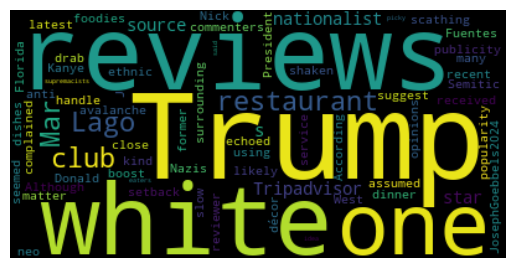

In [56]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Get the text from the first row
text = poc_data_selected_sample.loc[6, 'text']

# Create a WordCloud object
wordcloud = WordCloud().generate(text)

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


**Fake news 2**

In [57]:
# Assuming nnp_train_fake is your DataFrame
unique_values_fake_news_2 = pd.unique(poc_data_expanded_fake_news_2.values.ravel())

# Filter rows
filtered_df_news_2 = nnp_train_fake[nnp_train_fake.isin(unique_values_fake_news_2).any(axis=1)]


In [58]:
filtered_df_news_2.shape

(7693, 24)

In [59]:
filtered_df_news_2 = pd.concat([filtered_df_news_2, poc_data_expanded_fake_news_2])


In [60]:
filtered_df_news_2.shape

(7694, 24)

In [61]:
# Assuming df is your DataFrame
nnp_pagerank_fake_news_2 = create_pagerank(filtered_df_news_2)

# Print the PageRank scores
print(nnp_pagerank_fake_news_2)

{'House': 0.0002618682657898259, 'Might': 2.150531611890271e-05, 'Print': 8.191067367857712e-05, 'Britain': 0.00012150851907484265, 'Clinton': 0.0010219528437355933, 'Caddo': 1.0914455437771153e-05, 'FBI': 0.00030601061634228115, 'Massachusetts': 4.0083975868628726e-05, 'Camera': 9.579559552298197e-06, 'Israel': 0.0001083802236895178, '‘': 0.0006564963755401079, 'Thread': 7.960911601618245e-06, '’': 0.00451800456346258, 'Harry': 3.0629810178162955e-05, 'Gordon': 1.6926234586774167e-05, 'Whether': 4.776879927011267e-05, 'Obama': 0.00043423884617569433, 'Samantha': 2.021305275363653e-05, 'Trump': 0.0012065820436218168, 'Donald': 0.0007052209253472484, 'GLP': 2.1330025198425168e-05, 'Bernie': 9.053079709391205e-05, 'Daily': 0.00014769141236944776, 'Email': 0.00010168871565378492, 'Bob': 4.40408946985651e-05, nan: 7.960911601618245e-06, 'Colin': 2.026363926736945e-05, 'Dr.': 0.00017364266012990192, 'U.S.': 0.00046083347496654213, 'Patrick': 2.8538772521204223e-05, 'Catches': 9.692570109851

In [62]:
# Convert the dictionary to a Series and then to a DataFrame
nnp_pagerank_fake_news_2 = pd.Series(nnp_pagerank_fake_news_2).reset_index()
nnp_pagerank_fake_news_2.columns = ['Node', 'PageRank']

In [63]:
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2[nnp_pagerank_fake_news_2['Node'] != '’']
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2[nnp_pagerank_fake_news_2['Node'] != '”']
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2[nnp_pagerank_fake_news_2['Node'] != '“']
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2.dropna()
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2[nnp_pagerank_fake_news_2['Node'] != '‘']
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2[nnp_pagerank_fake_news_2['Node'] != '–']
nnp_pagerank_fake_news_2 = nnp_pagerank_fake_news_2[~nnp_pagerank_fake_news_2['Node'].str.startswith('nan')]



In [64]:
nnp_pagerank_fake_news_2.sort_values(by='PageRank', ascending=False).head(7)

,Node,PageRank
18,Trump,0.001207
4,Clinton,0.001022
66,Hillary,0.000928
74,October,0.000822
19,Donald,0.000705
84,November,0.000581
140,President,0.000575


In [65]:
fake_news_2 = nnp_pagerank_fake_news_2.sort_values(by='PageRank', ascending=False).head(7)
fake_news_2.to_excel("fake_news_2.xlsx")

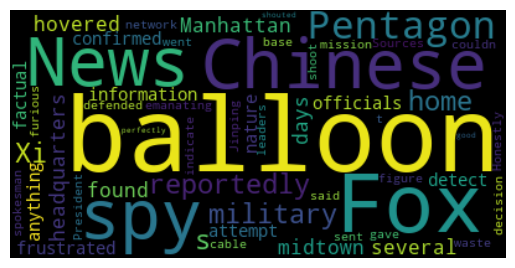

In [66]:
# Get the text from the first row
text = poc_data_selected_sample.loc[7, 'text']

# Create a WordCloud object
wordcloud = WordCloud().generate(text)

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

**Genuine  news 1**

In [67]:
poc_data_expanded_real_news_1 = poc_data_expanded_real.loc[[2]]
poc_data_expanded_real_news_2 = poc_data_expanded_real.loc[[4]]

In [68]:
# Assuming nnp_train_fake is your DataFrame
unique_values_real_news_1 = pd.unique(poc_data_expanded_real_news_1.values.ravel())

# Filter rows
filtered_df_real_news_1 = nnp_train_real[nnp_train_real.isin(unique_values_real_news_1).any(axis=1)]


In [69]:
filtered_df_real_news_1.shape

(9362, 24)

In [70]:
filtered_df_real_news_1 = pd.concat([filtered_df_real_news_1, poc_data_expanded_real_news_1])

In [71]:
filtered_df_real_news_1.shape

(9363, 24)

In [72]:
nnp_pagerank_real_news_1 = create_pagerank(filtered_df_real_news_1)

# Print the PageRank scores
print(nnp_pagerank_real_news_1)

{'Hillary': 0.00015825363326328493, 'Jackie': 1.752051797067935e-05, 'PARIS': 8.168947225918547e-06, 'Donald': 0.0006255917953679896, 'Michael': 0.00019327211503755902, 'Action': 4.782347238952882e-05, 'BBC': 4.881618013210528e-05, 'Guillermo': 8.168947225918547e-06, 'Wells': 2.893550355298463e-05, 'Wednesday': 0.0004183198264357547, 'Screenwriter': 8.168947225918547e-06, 'Sunday': 0.0004789507465240057, 'Zika': 3.895552929362207e-05, 'JERUSALEM': 8.168947225918547e-06, 'Andrea': 2.7587861340358157e-05, 'BuzzFeed': 2.0816139169918345e-05, 'MIDLAND': 8.168947225918547e-06, 'Don': 9.328380757554477e-05, 'VOROKHOBINO': 8.168947225918547e-06, 'Rep.': 4.986477205312243e-05, 'April': 0.0002199649706480321, 'MRI': 1.1859900232295613e-05, 'Ryan': 9.128204804445987e-05, 'Attorney': 6.600958765756376e-05, 'Century': 2.7520308567898176e-05, 'SAN': 9.40030003031852e-06, '’': 0.005147655342326766, 'America': 0.00038258540675035633, 'Smarter': 8.217159883663313e-06, 'United': 0.000778753025926535, '

In [73]:
nnp_pagerank_real_news_1 = pd.Series(nnp_pagerank_real_news_1).reset_index()
nnp_pagerank_real_news_1.columns = ['Node', 'PageRank']

In [74]:
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[nnp_pagerank_real_news_1['Node'] != '’']
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[nnp_pagerank_real_news_1['Node'] != '”']
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[nnp_pagerank_real_news_1['Node'] != '“']
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1.dropna()
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[nnp_pagerank_real_news_1['Node'] != '‘']
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[nnp_pagerank_real_news_1['Node'] != '–']
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[nnp_pagerank_real_news_1['Node'] != '—']
nnp_pagerank_real_news_1 = nnp_pagerank_real_news_1[~nnp_pagerank_real_news_1['Node'].str.startswith('nan')]

In [75]:
nnp_pagerank_real_news_1.sort_values(by='PageRank', ascending=False).head(7)

,Node,PageRank
1258,Mr.,0.001953
199,Trump,0.001133
118,New,0.001011
45,President,0.000807
2054,Ms.,0.000801
29,United,0.000779
2468,York,0.000690


In [76]:
real_news_1 = nnp_pagerank_real_news_1.sort_values(by='PageRank', ascending=False).head(7)
real_news_1.to_excel("real_news_1.xlsx")

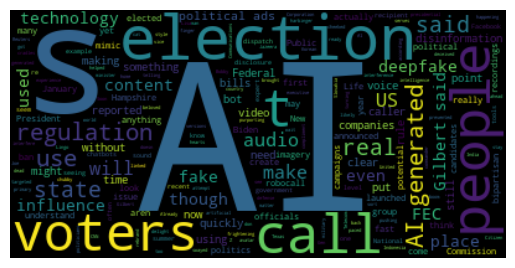

In [77]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Get the text from the first row
text = poc_data_selected_sample.loc[2, 'text']

# Create a WordCloud object
wordcloud = WordCloud().generate(text)

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()


**Genuine news 2**

In [78]:
# Assuming nnp_train_fake is your DataFrame
unique_values_real_news_2 = pd.unique(poc_data_expanded_real_news_2.values.ravel())

# Filter rows
filtered_df_real_news_2 = nnp_train_real[nnp_train_real.isin(unique_values_real_news_2).any(axis=1)]


In [79]:
filtered_df_real_news_2.shape

(9458, 24)

In [80]:
filtered_df_real_news_2 = pd.concat([filtered_df_real_news_2, poc_data_expanded_real_news_2])

In [81]:
filtered_df_real_news_2.shape

(9459, 24)

In [82]:
nnp_pagerank_real_news_2 = create_pagerank(filtered_df_real_news_2)

# Print the PageRank scores
print(nnp_pagerank_real_news_2)

{'Hillary': 0.00015594384540800746, 'Jackie': 1.723015460043662e-05, 'PARIS': 8.059193727198077e-06, 'Donald': 0.0006051992038124466, 'Michael': 0.00019464619969013236, 'Action': 4.581411400079694e-05, 'BBC': 4.852650826971576e-05, 'Guillermo': 8.059193727198077e-06, 'Wells': 2.8289869856957975e-05, 'Wednesday': 0.0004112199967899539, 'Screenwriter': 8.059193727198077e-06, 'Sunday': 0.00048104895925812533, 'Zika': 4.061887956030301e-05, 'JERUSALEM': 8.059193727198077e-06, 'Andrea': 2.6868826110447882e-05, 'BuzzFeed': 1.673831136941415e-05, 'MIDLAND': 8.059193727198077e-06, 'Don': 9.204883579262639e-05, 'VOROKHOBINO': 8.059193727198077e-06, 'Rep.': 5.298790118309393e-05, 'April': 0.00021006711482696015, 'MRI': 1.1683406250591513e-05, 'Ryan': 8.972988669513123e-05, 'Century': 2.7259525489140308e-05, 'SAN': 9.277520926279563e-06, '’': 0.005047821507153197, 'America': 0.00039557312557920895, 'Smarter': 8.10678906991168e-06, 'United': 0.0007792033447368532, 'Nobel': 3.09192980301154e-05, '“

In [83]:
nnp_pagerank_real_news_2 = pd.Series(nnp_pagerank_real_news_2).reset_index()
nnp_pagerank_real_news_2.columns = ['Node', 'PageRank']

In [84]:
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[nnp_pagerank_real_news_2['Node'] != '’']
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[nnp_pagerank_real_news_2['Node'] != '”']
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[nnp_pagerank_real_news_2['Node'] != '“']
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2.dropna()
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[nnp_pagerank_real_news_2['Node'] != '‘']
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[nnp_pagerank_real_news_2['Node'] != '–']
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[nnp_pagerank_real_news_2['Node'] != '—']
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2[~nnp_pagerank_real_news_2['Node'].str.startswith('nan')]


In [85]:
nnp_pagerank_real_news_2.sort_values(by='PageRank', ascending=False).head(7)

,Node,PageRank
380,Mr.,0.001964
200,Trump,0.001087
119,New,0.000990
2101,Ms.,0.000813
28,United,0.000779
62,President,0.000738
2515,York,0.000677


In [86]:
nnp_pagerank_real_news_2 = nnp_pagerank_real_news_2.sort_values(by='PageRank', ascending=False).head(7)
nnp_pagerank_real_news_2.to_excel("real_news_2.xlsx")

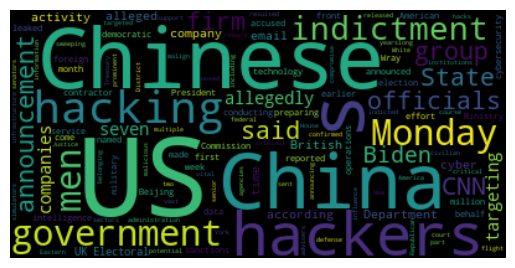

In [87]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Get the text from the first row
text = poc_data_selected_sample.loc[4, 'text']

# Create a WordCloud object
wordcloud = WordCloud().generate(text)

# Display the word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()
